# Buildmodel

Build nonlinear time series models from scalar time series data using minimum description length radila basis function formalism

## Sample data

First we generate some typical test data to play with

In [1]:
include("ChaosFunctions.jl")

┌ Info: Precompiling DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa]
└ @ Base loading.jl:1260


addnoise (generic function with 1 method)

In [2]:
using Plots

┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1260


In [3]:
z=lorenzpoints(5000,0.05)

3×5001 Array{Float64,2}:
 -9.3954   -9.11588  -8.65294  -8.14648  …   4.28449   3.72661   3.73862
 -9.09342  -8.3313   -7.63451  -7.18491      2.51742   3.21925   4.26658
 28.5537   28.7701   28.4925   27.8354      25.0368   22.4357   20.2786

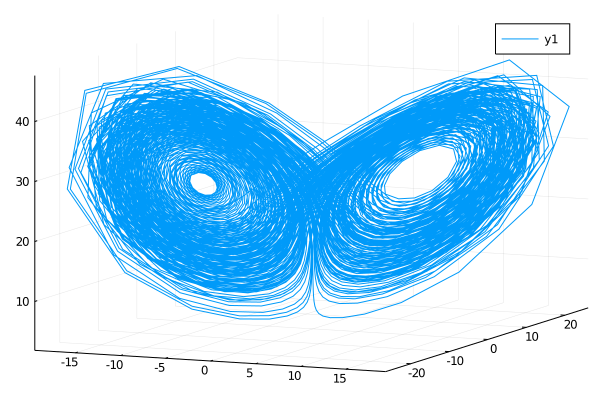

In [4]:
plot(z[1,:],z[2,:],z[3,:])

In [5]:
z=rosslerpoints(5000,0.2)

3×5001 Array{Float64,2}:
 -2.09051    -1.75877    -1.34197   …  -1.22664    -2.12111    -2.96475
 -1.45337    -1.90718    -2.303         4.50527     4.34763     4.00557
  0.0252208   0.0261013   0.027361      0.0330904   0.0282273   0.0247636

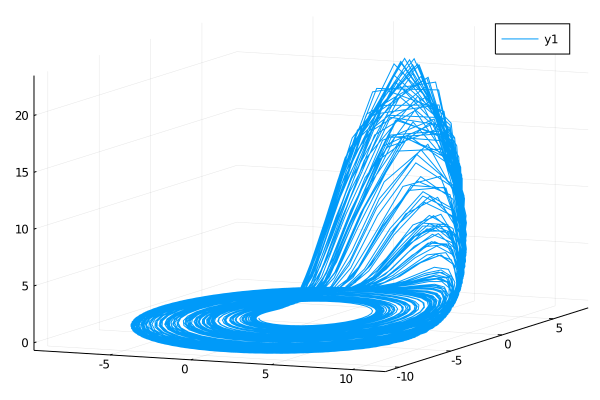

In [6]:
plot(z[1,:],z[2,:],z[3,:])

In [7]:
z=itmap(tinkerbell,-[0.7, 0.6],10000)

2×10000 Array{Float64,2}:
 -0.106024  -0.00524985   0.0848639  …  -0.0789416  -0.43416   -0.148745
 -0.407701  -0.329446    -0.171764      -0.978687   -0.492709  -0.686846

In [8]:
plot(z[2,:],z[1,:],linetype=:dots)

In [9]:
zn=addnoise(z,0.05)

2×10000 Array{Float64,2}:
 -0.091658  -0.00632023   0.0966057  …  -0.11289  -0.389918  -0.164502
 -0.393593  -0.353537    -0.213356      -1.01163  -0.498252  -0.710357

In [10]:
plot(zn[2,:],zn[1,:],linetype=:dots,markersize=0.1)

In [11]:
plot(zn[1,:],linetype=:dots,markersize=0.5)

In [12]:
z=itmap(logistic,1/π,10^4);

In [13]:
z=itmap(logistic,1/π,10^4);
zn=addnoise(z,0.05)
plot(zn[1:end-1],zn[2:end],linetype=:dots,markersize=0.1)

## Build the model

Import the modelling code, and away we go.

In [36]:
include("BasisFunctionTypes.jl")
include("Place.jl")

Main.Place

Any valid inline function can be used as a penalty function (it must operate on globally defined functions in `Place.topdown` and must return a scalar, the algorithm seeks a minimum of this function. Four useful examples follow (description length ala `Rissanen` requires extra computation in the main code to account for parameter precisions.

In [37]:
#need to make these variables in scope of the current WS
nx=Int64(length(z))
mss=Float64(Inf)
λ=Array{Float64,1}[]
δ=Array{Float64,1}[]
#valid penalty criteria
Schwarz = :(nx*log(mss)+nk*log(nx))
Akaike = :(nx*log(mss)+2*nk)
Rissanen = :(description(mss,λ,δ,nx)) #Rissanen desciption length
Model30 = :(-nk*(nk<=30))
#nx is # of observation (length of data)
#nk is # of parameters (basis functions in model)
#mss is the mean-sum-square model prediction error
#λ are the model parameters and δ their precisions

:(-nk * (nk <= 30))

Next, the dictionary `options` defined model structure and optional modelling parameters (it'll run a produce something even if `options` is empty, but it might be better to populate this somewhat intelligently. A useful example to model the (admittedly rather simple) logistic map is provided

In [38]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

And, then, away we go...

In [39]:
mymodel, X, zout, mdlv = Place.buildmodel(zn,options)

NaN generated in placebo
dx=4, nx=7999
needδ=true
*MSS=0.12354294606963966 DL=2990.9595996277153 size=1
MSS=0.14021992859472673 DL=3498.3088407664 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.07932385955832556 DL=1224.8850066590135 size=2
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.06828563989818569 DL=626.0012589467309 size=2
*MSS=0.052072297837838316 DL=-451.73194761075615 size=3
*MSS=0.005963136226838686 DL=-9115.580323096383 size=3
*MSS=0.0037267019089335224 DL=-10984.543018671377 size=4
*MSS=0.003334668681251248 DL=-11421.732887540287 size=5
*MSS=0.003054836638592394 DL=-11771.160930125767 size=5
*MSS=0.0028552807487314054 DL=-12033.494372902833 size=6
*MSS=0.0028499068763736765 DL=-12034.03956544065 size=7
MSS=0.0029553963044717637 DL=-11889.335806266095 size=7
*MSS=0.0027613928310653534 DL=-12154.32669124009 size=8
*MSS=0.0027193080955410713 DL=-12208.536068468055 size=9
*MSS=0.002676502090353366 DL=-12271.578672404507 size=9

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [0], 0.5452815549035932, [0.3313422623802459 0.4547821975946901 … 0.16951861076772118 0.2444563981763421], [3.9069814346882437]), Main.Place.BasisFunc(tophat, [0], 0.25547592918174283, [0.3313422623802459 0.4547821975946901 … 0.16951861076772118 0.2444563981763421], [4.7907810975542215]), Main.Place.BasisFunc(tophat, [1], 0.2554746696985263, [0.8826514018704682 0.1289626401596224 … 0.04577678487596063 0.056951709118977165], [2.1769178657426123]), Main.Place.BasisFunc(tophat, [0, 1, 2], 0.6825621035083196, [0.3313422623802459 0.4547821975946901 … 0.16951861076772118 0.2444563981763421; 0.8826514018704682 0.1289626401596224 … 0.04577678487596063 0.056951709118977165; 0.6550192152348465 0.9442321269817775 … -0.004917368714855852 -0.019851548947669086], [3.8173693766179038]), Main.Place.BasisFunc(tophat, [1, 2], 0.14389379788608003, [0.8826514018704682 0.1289626401596224 … 0.04577678487596063 0.056951709118977165; 0.6

Modelling done, we can make one-step predictions on time series data

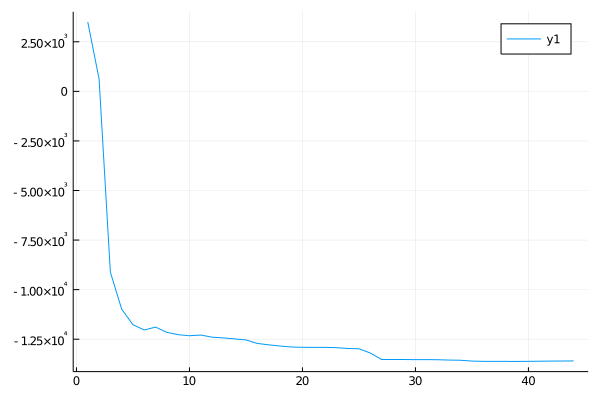

In [41]:
plot(mdlv)

In [42]:
yp,yt,ep = Place.predict(mymodel, z);

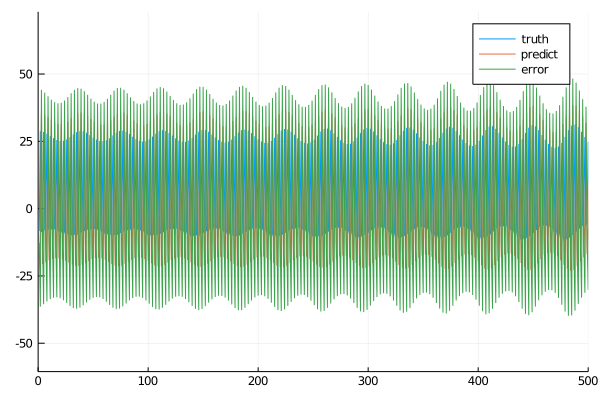

In [43]:
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

Or, free run simulations

In [44]:
yp, yt = Place.freerun(mymodel,zn,500)

([0.009177724089439001, 0.04089434587788988, 0.14705347881736378, 0.49914027000072314, 0.9988567410009347, 0.004945114866170653, 0.036540727559502724, 0.13332484517503027, 0.45732454630991665, 0.9854372333160606  …  0.6532137873008671, 0.9072429446541377, 0.3181011984502772, 0.8670303341349792, 0.4589513934541795, 0.9866199034389144, 0.030781960494537026, 0.12370022185852389, 0.4137852735317165, 0.9671522777348636], [0.03202668402498098, 0.011498259794205243, 0.06395511626092674, 0.21423997114390098, 0.6438153028425905, 0.9193645952813737, 0.24603674364579434, 0.781847364299472, 0.7328751829564053, 0.826889302452721  …  0.15892534026867874, 0.4653675037467506, 0.993431296401839, 0.006480607232096713, 0.05338395417349311, 0.04856868118887822, 0.13248557193780372, 0.4607373504688514, 0.9737028352419707, 0.03865378456861146])

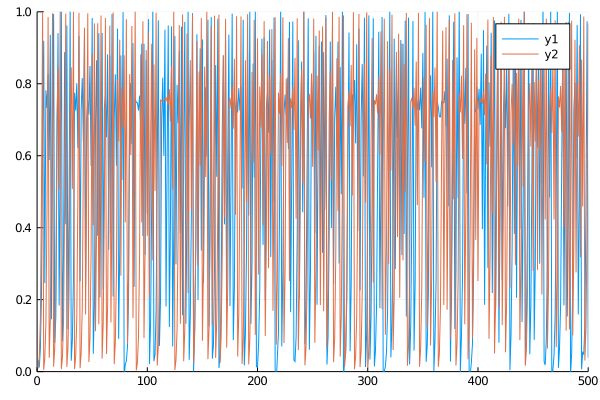

In [45]:
plot(yt)
plot!(yp,ylimit=(0,1),xlimit=(0,500))


In [23]:
plot(yt[1:end-1],yt[2:end],linetype=:dots,markersize=0.1,label="test data")
plot!(yp[1:end-1],yp[2:end],linetype=:dots,markersize=1,label="model simulation",title="attractor")

UndefVarError: UndefVarError: yt not defined

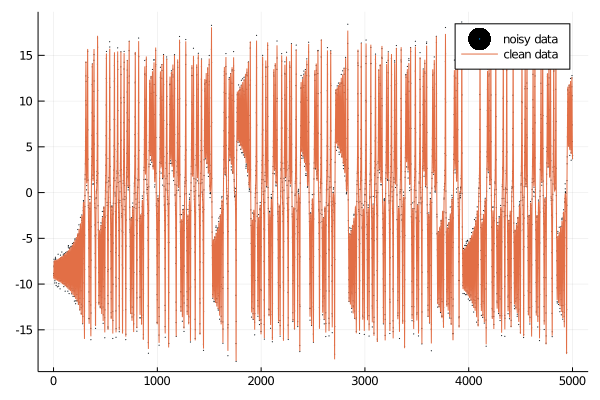

In [24]:
z=lorenzpoints(5000,0.05)
y=z[1,:]
yn=addnoise(y,0.05)
plot(yn,linetype=:dots,markersize=0.5,label="noisy data")
plot!(y,label="clean data")

In [25]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3,6,12]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

UndefVarError: UndefVarError: vembed not defined

In [26]:
mymodel, X, zout, mdlv = Place.buildmodel(yn,options)

UndefVarError: UndefVarError: buildmodel not defined

In [27]:
plot(mdlv)

UndefVarError: UndefVarError: mdlv not defined

In [28]:
yp,yt,ep = Place.predict(mymodel, yn);
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

UndefVarError: UndefVarError: predict not defined

In [29]:
yp, yt = Place.freerun(mymodel,yn,500)
plot(yt,label="test data")
plot!(yp,label="free-run prediction")

UndefVarError: UndefVarError: freerun not defined

In [30]:
plot(yt[1:end-6],yt[4:end-3],yt[7:end],linetype=:dots,markersize=1,label="test data")
plot!(yp[1:end-6],yp[4:end-3],yp[7:end],label="model simulation",title="attractor")

UndefVarError: UndefVarError: yt not defined

## Michael Small

Last updated 12/7

In [31]:
size(yn)

(5001,)

In [32]:
yn

5001-element Array{Float64,1}:
 -8.852051689482687
 -9.047123151255738
 -8.850313167291063
 -8.112516996097215
 -7.284350582430741
 -7.991776841859575
 -7.508247017700609
 -7.660966149275063
 -7.826059576682523
 -8.922095519457185
 -8.838980072864894
 -9.877738918657146
 -9.63607637740274
  ⋮
  6.084306766652797
  7.766985067604852
 10.135238707552693
 11.557452899877799
 12.524293426001226
 12.784570916593607
 10.578507332211746
  7.393363446574696
  5.574917239261319
  3.9968821784013433
  3.7075951809646006
  4.045861925018318